In [1]:
import os, sys
import numpy as np
import torch
from PIL import Image
from torchvision.utils import make_grid
from torchvision.transforms import ToPILImage, ToTensor, Pad
sys.path.append('/home/ysig/nicolas/learnable-typewriter-supervised')
from learnable_typewriter.utils.loading import load_pretrained_model
from learnable_typewriter.evaluate.qualitative.decompositor import Decompositor
from learnable_typewriter.evaluate.quantitative.sprite_matching.evaluate import inference 
from learnable_typewriter.evaluate.quantitative.sprite_matching.metrics import error_rate 
from learnable_typewriter.data.dataloader import collate_fn_pad_to_max
from IPython.display import display
import joblib
from os.path import join

In [2]:
def seg(trainer, test_idx):
    trainer.__init_decompositor__()
    topil = ToPILImage()
    dataset = trainer.test_loader[0].dataset
    x = collate_fn_pad_to_max([dataset[test_idx]], supervised=True)
    obj = trainer.decompositor(x)
    gt = topil(x['x'].cpu()[0])
    rec = topil(obj['reconstruction'].cpu()[0])
    sgm = topil(obj['segmentation'].cpu()[0])
    return gt, rec, sgm

def resize_w(img, w):
    img = img.convert('RGB')
    wpercent = (w/float(img.size[0]))
    h = int((float(img.size[1])*float(wpercent)))
    img = img.resize((w, h), Image.Resampling.LANCZOS)
    return img

def add_pad_h(img, pad):
    pad = Pad([0, 0, 0, pad], fill=255, padding_mode='constant')
    return pad(img)

def assort(imgs):
    totensor = ToTensor()
    topil = ToPILImage()
    grid = torch.cat([totensor(img) for img in imgs], dim=1)
    return topil(grid)

def teaser(trainer, test_idx=0, place=['gt', 'rec', 'sgm'], pad_h=[3, 3, 0], n_row=4):
    gt, rec, sgm = seg(trainer, test_idx)
    figs = {'gt': gt, 'rec': rec, 'sgm': sgm}
    return assort([add_pad_h(figs[p], h) for p, h in zip(place, pad_h)])

In [3]:
mathieu_dir = 'mathieu'
os.makedirs(join(mathieu_dir, 'copiale'), exist_ok=True)
os.makedirs(join(mathieu_dir, 'google'), exist_ok=True)

## Copiale 

In [4]:
SUP = '/home/ysig/nicolas/learnable-typewriter-supervised/golden-experiments/copiale-sup-1.5-0.01'
UNSUP = '/home/ysig/nicolas/learnable-typewriter-supervised/golden-experiments/unsup-copiale'

In [5]:
trainer_unsup = load_pretrained_model(path=UNSUP, device=None)
trainer = load_pretrained_model(path=SUP, device=None)

{'color': {'path': 'copiale/color', 'sep': ' ', 'space': '_', 'supervised': False, 'crop_width': 192}}
self.canvas_size [96, 192]
Generator is UNET
Selection init with dim_enc=64, dim_sprites=2304 --> dim_z=64
self.tsf_names ['color', 'position']
self.tsf_names ['color', 'position']
{'color': {'path': 'copiale/color', 'sep': ' ', 'space': '_', 'supervised': True}}


/home/ysig/nicolas/learnable-typewriter-supervised/learnable_typewriter/typewriter/model.py:259: UserWarning: load_state_dict: The following keys were found in loaded dict but not in self.state_dict():
{'layer_transformation.tsf_sequences.0.tsf_modules.1.identity', 'background_transformation.tsf_sequences.0.tsf_modules.1.identity'}
  warnings.warn(f'load_state_dict: The following keys were found in loaded dict but not in self.state_dict():\n{diff_amb}')
/home/ysig/nicolas/learnable-typewriter-supervised/learnable_typewriter/typewriter/model.py:263: UserWarning: load_state_dict: The following keys were found in self.state_dict() dict but not in loaded dict:
set()
  warnings.warn(f'load_state_dict: The following keys were found in self.state_dict() dict but not in loaded dict:\n{diff_bma}')


self.canvas_size [96, 192]
Generator is MLP
Selection init with dim_enc=64, dim_sprites=2304 --> dim_z=64
self.tsf_names ['color', 'position']
self.tsf_names ['color', 'position']


tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.canvas_size [96, 192]
tsf_bkgs_i.size() torch.Size([1, 3, 96, 192])
self.

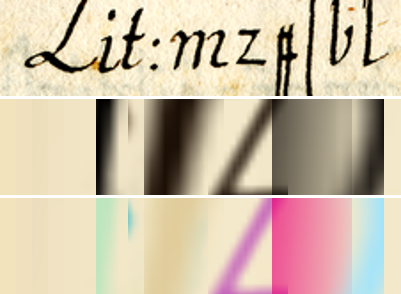

In [6]:
display(teaser(trainer, 0))

In [ ]:
# for idx, i in enumerate(np.random.choice(len(trainer.test_loader[0].dataset), size=20, replace=False)):
#     for tag, t in zip(['sup', 'unsup'], [trainer, trainer_unsup]):
#         img = teaser(t, i)
#         display(img)
#         img.save(join(mathieu_dir, 'copiale', f'{tag}-{idx}.png'))

In [31]:
def plot_colored_sprites(trainer, n_row=4):
    trainer.__init_decompositor__()

    masks = trainer.model.masks
    colors = torch.Tensor(trainer.decompositor.colors)
    colors = colors.unsqueeze(-1).unsqueeze(-1)  #size (K,3,1,1)
    colors = 1 - colors.expand(masks.size()[0], 3, *masks.size()[2:]) #size (K,3,H_sprite,W_sprite)

    masks = (1 - colors*masks.expand(-1, 3, -1, -1))

    if trainer.unsupervised:
        order = range(len(trainer.model.sprites))
        order = sorted(order, key=lambda k: trascribe_unsupervised[k])
        masks = torch.cat([masks[i].unsqueeze(0) for i in order], dim=0)
    else:
        order = list(range(4)) + list(range(22, len(trainer.model.sprites))) + list(range(4, 22))
        masks = torch.cat([masks[i].unsqueeze(0) for i in order], dim=0)
    return ToPILImage()(make_grid(masks, nrow=len(trainer.model.sprites)//n_row, padding_value=1, padding=2))

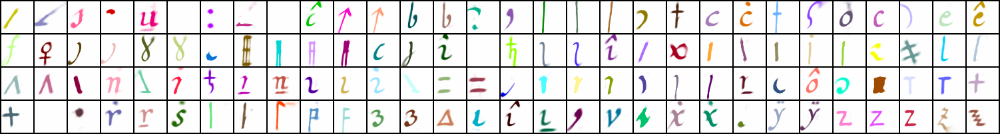

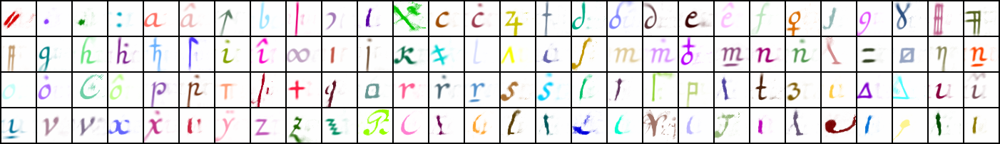

In [32]:
trascribe_unsupervised = joblib.load('/home/ysig/nicolas/learnable-typewriter-supervised/golden-experiments/unsup-copiale/er_mapping.pkl')
image = plot_colored_sprites(trainer_unsup)
display(image)
image.save(join(mathieu_dir, 'copiale', f'unsup.png'))
image = plot_colored_sprites(trainer)
display(image)
image.save(join(mathieu_dir, 'copiale', f'sup.png'))

## Google

In [39]:
SUP = '/home/ysig/nicolas/learnable-typewriter-supervised/golden-experiments/google-final-sup'
UNSUP = '/home/ysig/nicolas/learnable-typewriter-supervised/golden-experiments/google-unsup-use-this-same-as-copiale/2022-11-10_13-44-58'

{'G1000_V2': {'path': 'Google1000/Volume_0002', 'supervised': False, 'crop_width': 128}}
Generator is UNET
Selection init with dim_enc=64, dim_sprites=1024 --> dim_z=64
{'lr': 0.0001, 'weight_decay': 0}
Selection(
  (linear): Sequential(
    (0): Linear(in_features=1024, out_features=64, bias=True)
    (1): LayerNorm((64,), eps=1e-05, elementwise_affine=False)
  )
  (anchors): Sequential(
    (0): Linear(in_features=64, out_features=64, bias=True)
    (1): LayerNorm((64,), eps=1e-05, elementwise_affine=False)
  )
)
{'G1000_V2': {'path': 'Google1000/Volume_0002', 'supervised': True}}
Generator is MLP
Selection init with dim_enc=64, dim_sprites=1024 --> dim_z=64
{'lr': 0.001, 'weight_decay': 0}
Selection(
  (linear): Sequential(
    (0): Linear(in_features=1024, out_features=64, bias=True)
    (1): LayerNorm((64,), eps=1e-05, elementwise_affine=False)
  )
  (anchors): Sequential(
    (0): Linear(in_features=64, out_features=64, bias=True)
    (1): LayerNorm((64,), eps=1e-05, elementwise_

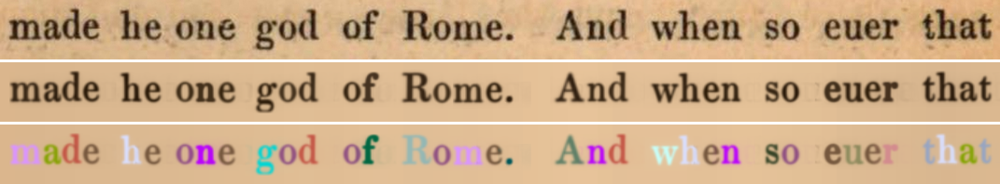

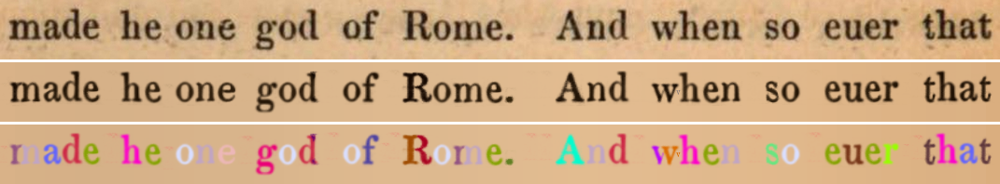

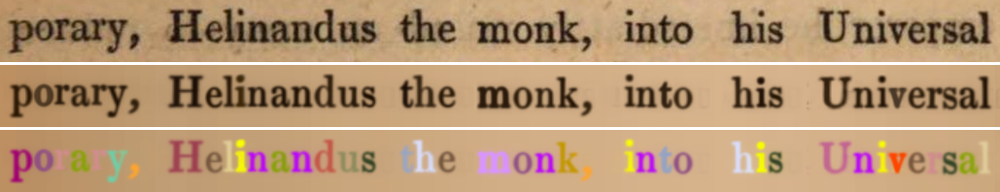

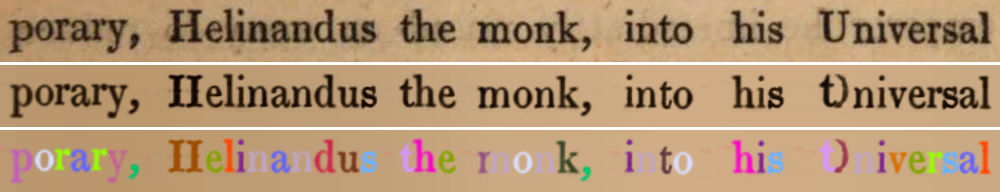

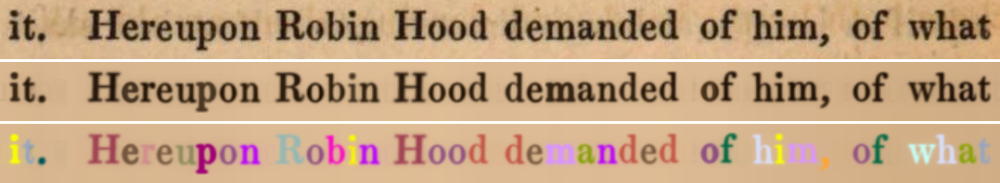

...

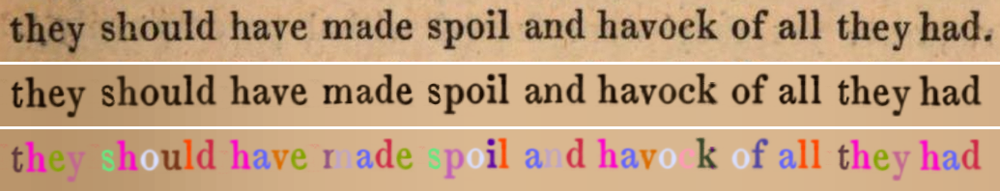

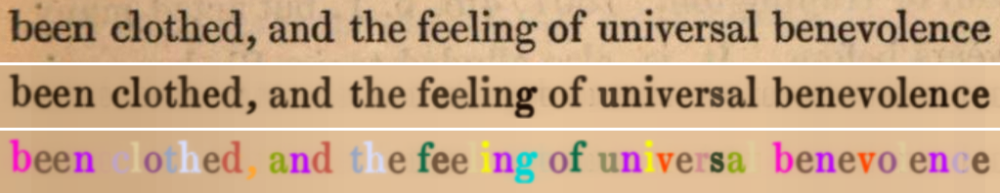

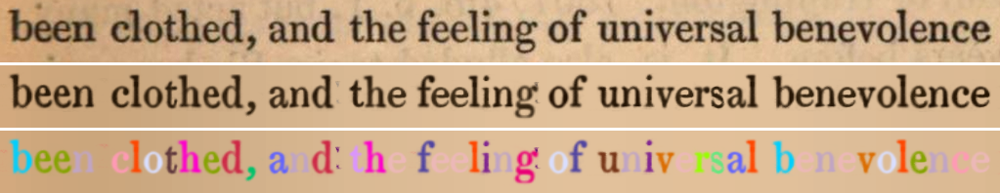

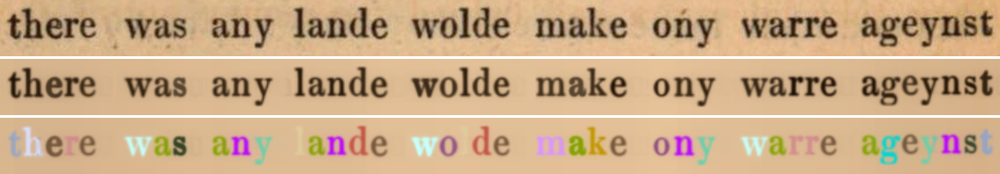

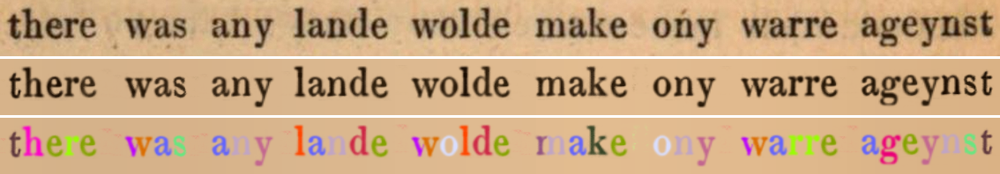

In [9]:
trainer_unsup = load_pretrained_model(path=UNSUP, device=None)
trainer = load_pretrained_model(path=SUP, device=None)
# for idx, i in enumerate(np.random.choice(len(trainer.test_loader[0].dataset), size=20, replace=False)):
#     for tag, t in zip(['sup', 'unsup'], [trainer, trainer_unsup]):
#         img = teaser(t, i)
#         display(img)
#         img.save(join(mathieu_dir, 'google', f'{tag}-{idx}.png'))

In [55]:
def plot_colored_sprites(trainer, n_row=4, ignore_ids=[], order_type=None, which='copiale'):
    trainer.__init_decompositor__()

    masks = trainer.model.masks
    colors = torch.Tensor(trainer.decompositor.colors)
    colors = colors.unsqueeze(-1).unsqueeze(-1)  #size (K,3,1,1)
    colors = 1 - colors.expand(masks.size()[0], 3, *masks.size()[2:]) #size (K,3,H_sprite,W_sprite)

    masks = (1 - colors*masks.expand(-1, 3, -1, -1))

    if trainer.unsupervised:
        if which == 'copiale':
            order = range(len(trainer.model.sprites))
            order = sorted(order, key=lambda k: trascribe_unsupervised[k])
        else:
            print('order')
            order = range(len(trainer.model.sprites))
            order = sorted(order, key=lambda k: trascribe_unsupervised_google[k])
    else:
        if isinstance(order_type, list):
            print('hey')
            order = order_type
        elif order_type == 'copiale':
            order = list(range(4)) + list(range(22, len(trainer.model.sprites))) + list(range(4, 22))
        else:
            order = range(len(trainer.model.sprites))

    masks = torch.cat([masks[i].unsqueeze(0) for j, i in enumerate(order) if j not in ignore_ids] + [torch.ones_like(masks[0].unsqueeze(0))], dim=0)
    return ToPILImage()(make_grid(masks, nrow=n_row, padding_value=1, padding=2))

{'G1000_V2': {'path': 'Google1000/Volume_0002', 'supervised': True}}
Generator is MLP
Selection init with dim_enc=64, dim_sprites=1024 --> dim_z=64
{'lr': 0.001, 'weight_decay': 0}
Selection(
  (linear): Sequential(
    (0): Linear(in_features=1024, out_features=64, bias=True)
    (1): LayerNorm((64,), eps=1e-05, elementwise_affine=False)
  )
  (anchors): Sequential(
    (0): Linear(in_features=64, out_features=64, bias=True)
    (1): LayerNorm((64,), eps=1e-05, elementwise_affine=False)
  )
)
hey


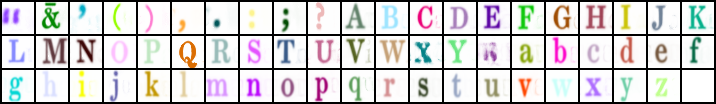

In [56]:
ignore_ids = [] 
trainer = load_pretrained_model(path=SUP, device=None)
order_type = [1, 2, 3, 4, 5, 7, 9, 19, 20] + list(range(23, 50)) + list(range(52, 78))
im = plot_colored_sprites(trainer, order_type=order_type, n_row=21)
display(im)
im.save(join(mathieu_dir, 'google', f'sup.png'))

In [64]:
def plot_colored_sprites(trainer, n_row=4, ignore_ids=[], order_type=None, which='copiale'):
    trainer.__init_decompositor__()

    masks = trainer.model.masks
    colors = torch.Tensor(trainer.decompositor.colors)
    colors = colors.unsqueeze(-1).unsqueeze(-1)  #size (K,3,1,1)
    colors = 1 - colors.expand(masks.size()[0], 3, *masks.size()[2:]) #size (K,3,H_sprite,W_sprite)

    masks = (1 - colors*masks.expand(-1, 3, -1, -1))

    if trainer.unsupervised:
        if which == 'copiale':
            order = range(len(trainer.model.sprites))
            order = sorted(order, key=lambda k: trascribe_unsupervised[k])
        else:
            print('order')
            order = range(len(trainer.model.sprites))
            order = sorted(order, key=lambda k: trascribe_unsupervised_google[k])
    else:
        if isinstance(order_type, list):
            print('hey')
            order = order_type
        elif order_type == 'copiale':
            order = list(range(4)) + list(range(22, len(trainer.model.sprites))) + list(range(4, 22))
        else:
            order = range(len(trainer.model.sprites))

#              + [torch.ones_like(masks[0].unsqueeze(0))]
    masks = torch.cat([masks[i].unsqueeze(0) for j, i in enumerate(order) if j not in ignore_ids], dim=0)
    return ToPILImage()(make_grid(masks, nrow=n_row, padding_value=1, padding=2))

{'G1000_V2': {'path': 'Google1000/Volume_0002', 'supervised': False, 'crop_width': 128}}
Generator is UNET
Selection init with dim_enc=64, dim_sprites=1024 --> dim_z=64
{'lr': 0.0001, 'weight_decay': 0}
Selection(
  (linear): Sequential(
    (0): Linear(in_features=1024, out_features=64, bias=True)
    (1): LayerNorm((64,), eps=1e-05, elementwise_affine=False)
  )
  (anchors): Sequential(
    (0): Linear(in_features=64, out_features=64, bias=True)
    (1): LayerNorm((64,), eps=1e-05, elementwise_affine=False)
  )
)
order


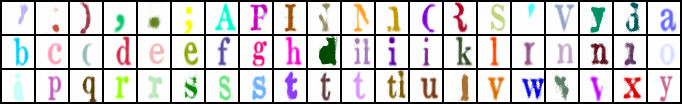

In [68]:
UNSUP = '/home/ysig/nicolas/learnable-typewriter-supervised/golden-experiments/google-unsup-use-this-same-as-copiale/2022-11-10_13-44-58'
trascribe_unsupervised_google = torch.load(f'{UNSUP}/model.pth')['transcribe']

order_type = [1, 2, 3, 4, 5, 7, 9, 19, 20] + list(range(23, 50)) + list(range(52, 78))
ignore_ids = list(range(1, 4)) + [5, 7, 8, 11, 12, 13, 14, 15, 18] + list(range(20, 25)) + [60, 62, 63, 27, 28, 29, 32, 34, 36, 38, 39, 41, 44, 45, 46, 47, 48, 50, 51, 54, 55, 65, 66, 75, 76, 78, 82, 83, 86, 92, 95, 97, 99, 101, 103, 107, 113, 114, 115, 116, 117, 118, 119]

trainer_unsup = load_pretrained_model(path=UNSUP, device=None)
im = plot_colored_sprites(trainer_unsup, which='google', ignore_ids=ignore_ids, n_row=20)
display(im)
im.save(join(mathieu_dir, 'google', f'unsup.png'))